In [1]:
import matplotlib.pyplot as plt
from PIL import Image
def image_grid(imgs):
    """Load and show images in a grid from a list of paths"""
    count = len(imgs)
    plt.figure(figsize=(11, 18))
    for ix, path in enumerate(imgs):
        plt.subplots_adjust(bottom=0.3, right=0.8, top=0.5)
        ax = plt.subplot(3, 5, ix + 1)
        ax.axis('off')
        plt.imshow(path)
    plt.tight_layout()


In [2]:
from huggingface_hub import login
login()

In [3]:
import os , torch
device = "0"
os.environ["CUDA_VISIBLE_DEVICES"]=device
print(torch.cuda.device_count())
import argparse
import copy
import gc
import itertools
import logging
import math

import random
import shutil
import warnings
from contextlib import nullcontext
from pathlib import Path

import numpy as np
import torch
import torch.utils.checkpoint
import transformers
from accelerate import Accelerator
from accelerate.logging import get_logger
from accelerate.utils import DistributedDataParallelKwargs, ProjectConfiguration, set_seed
from huggingface_hub import create_repo, upload_folder
from huggingface_hub.utils import insecure_hashlib
from peft import LoraConfig, set_peft_model_state_dict, get_peft_model
from peft.utils import get_peft_model_state_dict
from PIL import Image
from PIL.ImageOps import exif_transpose
from torch.utils.data import Dataset
from torchvision import transforms
from torchvision.transforms.functional import crop
from tqdm.auto import tqdm
from transformers import CLIPTokenizer, PretrainedConfig, T5TokenizerFast

import diffusers
from diffusers import (
    AutoencoderKL,
    FlowMatchEulerDiscreteScheduler,
    FluxTransformer2DModel,
)
from diffusers.optimization import get_scheduler
from diffusers.training_utils import (
    _set_state_dict_into_text_encoder,
    cast_training_params,
    compute_density_for_timestep_sampling,
    compute_loss_weighting_for_sd3,
)
from diffusers.utils import (
    check_min_version,
    convert_unet_state_dict_to_peft,
    is_wandb_available,
)
from diffusers.utils.hub_utils import load_or_create_model_card, populate_model_card
from diffusers.utils.torch_utils import is_compiled_module

import sys
sys.path.append('../../.')
from utils.custom_flux_pipeline import FluxPipeline
from collections import defaultdict


from typing import List, Optional
import argparse
import ast
from pathlib import Path
from diffusers import DiffusionPipeline, UNet2DConditionModel, LCMScheduler
from huggingface_hub import hf_hub_download
import gc
import torch.nn.functional as F
import os
import torch
from tqdm.auto import tqdm
import time, datetime
import numpy as np
from torch.optim import AdamW
from contextlib import ExitStack
from safetensors.torch import load_file
import torch.nn as nn
import random
from transformers import CLIPModel

from utils.lora import LoRANetwork, DEFAULT_TARGET_REPLACE, UNET_TARGET_REPLACE_MODULE_CONV
from utils import train_util, model_util, prompt_util
from utils.prompt_util import (
    PromptEmbedsCache,
    PromptEmbedsPair,
    PromptSettings,
    PromptEmbedsXL,
)
from transformers import logging
logging.set_verbosity_warning()

from diffusers import logging
logging.set_verbosity_error()
modules = DEFAULT_TARGET_REPLACE

1


/opt/venv/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/opt/venv/lib/python3.10/site-packages/torchvision/image.so: undefined symbol: _ZN5torch3jit17parseSchemaOrNameERKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
/opt/venv/lib/python3.10/site-packages/xformers/ops/fmha/flash.py:211: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_fwd")
/opt/venv/lib/python3.10/site-packages/xformers/ops/fmha/flash.py:344: FutureWarning: `torch.library.impl_abstract` was renamed t

In [4]:
pretrained_model_name_or_path = "black-forest-labs/FLUX.1-dev"
pretrained_model_name_or_path = "black-forest-labs/FLUX.1-schnell"
pretrained_model_name_or_path = "../../../models/FLUX.1-schnell"
weight_dtype = torch.bfloat16

device = "cuda:0"

max_train_steps = 1000


num_inference_steps = 30
guidance_scale = 3.5
max_sequence_length = 512
height = width = 512
if 'schnell' in pretrained_model_name_or_path:
    num_inference_steps = 4
    guidance_scale = 0
    max_sequence_length = 256   

# timestep weighting
weighting_scheme = 'none' #["sigma_sqrt", "logit_normal", "mode", "cosmap", "none"]
logit_mean = 0.0
logit_std = 1.0
mode_scale = 1.29
bsz = 1
training_eta = 1
# optimizer params
lr = 0.002

output_dir = '../../models/fluxsliders'
if 'schnell' in pretrained_model_name_or_path:
    output_dir = output_dir+'/schnell/'
else:
    output_dir = output_dir+'/dev/'
os.makedirs(output_dir, exist_ok=True)


target_prompt = 'picture of a person'
positive_prompt = 'photo of a person, smiling, happy'
negative_prompt = 'photo of a person, frowning'
slider_name = 'person-smiling'
# lora params
alpha = 1
rank = 16
train_method = 'xattn'
num_sliders  = 1

# training params
batchsize = 1
eta = 2

In [5]:
def flush():
    torch.cuda.empty_cache()
    gc.collect()
flush()
def unwrap_model(model):
    options = (torch.nn.parallel.DistributedDataParallel, torch.nn.DataParallel)
    #if is_deepspeed_available():
    #    options += (DeepSpeedEngine,)
    while isinstance(model, options):
        model = model.module
    return model


# Function to log gradients
def log_gradients(named_parameters):
    grad_dict = defaultdict(lambda: defaultdict(float))
    for name, param in named_parameters:
        if param.requires_grad and param.grad is not None:
            grad_dict[name]['mean'] = param.grad.abs().mean().item()
            grad_dict[name]['std'] = param.grad.std().item()
            grad_dict[name]['max'] = param.grad.abs().max().item()
            grad_dict[name]['min'] = param.grad.abs().min().item()
    return grad_dict
    
def import_model_class_from_model_name_or_path(
    pretrained_model_name_or_path: str, subfolder: str = "text_encoder"
):
    text_encoder_config = PretrainedConfig.from_pretrained(
        pretrained_model_name_or_path, subfolder=subfolder
        , device_map=device
    )
    model_class = text_encoder_config.architectures[0]
    if model_class == "CLIPTextModel":
        from transformers import CLIPTextModel

        return CLIPTextModel
    elif model_class == "T5EncoderModel":
        from transformers import T5EncoderModel

        return T5EncoderModel
    else:
        raise ValueError(f"{model_class} is not supported.")
def load_text_encoders(pretrained_model_name_or_path, class_one, class_two, weight_dtype):
    text_encoder_one = class_one.from_pretrained(
        pretrained_model_name_or_path, 
        subfolder="text_encoder", 
        torch_dtype=weight_dtype,
        device_map=device
    )
    text_encoder_two = class_two.from_pretrained(
        pretrained_model_name_or_path, 
        subfolder="text_encoder_2", 
        torch_dtype=weight_dtype,
        device_map=device
    )
    return text_encoder_one, text_encoder_two
import matplotlib.pyplot as plt
def plot_labeled_images(images, labels):
    # Determine the number of images
    n = len(images)
    
    # Create a new figure with a single row
    fig, axes = plt.subplots(1, n, figsize=(5*n, 5))
    
    # If there's only one image, axes will be a single object, not an array
    if n == 1:
        axes = [axes]
    
    # Plot each image
    for i, (img, label) in enumerate(zip(images, labels)):
        # Convert PIL image to numpy array
        img_array = np.array(img)
        
        # Display the image
        axes[i].imshow(img_array)
        axes[i].axis('off')  # Turn off axis
        
        # Set the title (label) for the image
        axes[i].set_title(label)
    
    # Adjust the layout and display the plot
    plt.tight_layout()
    plt.show()
    

def tokenize_prompt(tokenizer, prompt, max_sequence_length):
    text_inputs = tokenizer(
        prompt,
        padding="max_length",
        max_length=max_sequence_length,
        truncation=True,
        return_length=False,
        return_overflowing_tokens=False,
        return_tensors="pt",
    )
    text_input_ids = text_inputs.input_ids
    return text_input_ids


def _encode_prompt_with_t5(
    text_encoder,
    tokenizer,
    max_sequence_length=512,
    prompt=None,
    num_images_per_prompt=1,
    device=None,
    text_input_ids=None,
):
    prompt = [prompt] if isinstance(prompt, str) else prompt
    batch_size = len(prompt)

    if tokenizer is not None:
        text_inputs = tokenizer(
            prompt,
            padding="max_length",
            max_length=max_sequence_length,
            truncation=True,
            return_length=False,
            return_overflowing_tokens=False,
            return_tensors="pt",
        )
        text_input_ids = text_inputs.input_ids
    else:
        if text_input_ids is None:
            raise ValueError("text_input_ids must be provided when the tokenizer is not specified")

    prompt_embeds = text_encoder(text_input_ids.to(device))[0]

    dtype = text_encoder.dtype
    prompt_embeds = prompt_embeds.to(dtype=dtype, device=device)

    _, seq_len, _ = prompt_embeds.shape

    # duplicate text embeddings and attention mask for each generation per prompt, using mps friendly method
    prompt_embeds = prompt_embeds.repeat(1, num_images_per_prompt, 1)
    prompt_embeds = prompt_embeds.view(batch_size * num_images_per_prompt, seq_len, -1)

    return prompt_embeds


def _encode_prompt_with_clip(
    text_encoder,
    tokenizer,
    prompt: str,
    device=None,
    text_input_ids=None,
    num_images_per_prompt: int = 1,
):
    prompt = [prompt] if isinstance(prompt, str) else prompt
    batch_size = len(prompt)

    if tokenizer is not None:
        text_inputs = tokenizer(
            prompt,
            padding="max_length",
            max_length=77,
            truncation=True,
            return_overflowing_tokens=False,
            return_length=False,
            return_tensors="pt",
        )

        text_input_ids = text_inputs.input_ids
    else:
        if text_input_ids is None:
            raise ValueError("text_input_ids must be provided when the tokenizer is not specified")

    prompt_embeds = text_encoder(text_input_ids.to(device), output_hidden_states=False)

    # Use pooled output of CLIPTextModel
    prompt_embeds = prompt_embeds.pooler_output
    prompt_embeds = prompt_embeds.to(dtype=text_encoder.dtype, device=device)

    # duplicate text embeddings for each generation per prompt, using mps friendly method
    prompt_embeds = prompt_embeds.repeat(1, num_images_per_prompt, 1)
    prompt_embeds = prompt_embeds.view(batch_size * num_images_per_prompt, -1)

    return prompt_embeds

def encode_prompt(
    text_encoders,
    tokenizers,
    prompt: str,
    max_sequence_length,
    device=None,
    num_images_per_prompt: int = 1,
    text_input_ids_list=None,
):
    prompt = [prompt] if isinstance(prompt, str) else prompt
    batch_size = len(prompt)
    dtype = text_encoders[0].dtype

    pooled_prompt_embeds = _encode_prompt_with_clip(
        text_encoder=text_encoders[0],
        tokenizer=tokenizers[0],
        prompt=prompt,
        device=device if device is not None else text_encoders[0].device,
        num_images_per_prompt=num_images_per_prompt,
        text_input_ids=text_input_ids_list[0] if text_input_ids_list else None,
    )

    prompt_embeds = _encode_prompt_with_t5(
        text_encoder=text_encoders[1],
        tokenizer=tokenizers[1],
        max_sequence_length=max_sequence_length,
        prompt=prompt,
        num_images_per_prompt=num_images_per_prompt,
        device=device if device is not None else text_encoders[1].device,
        text_input_ids=text_input_ids_list[1] if text_input_ids_list else None,
    )

    text_ids = torch.zeros(batch_size, prompt_embeds.shape[1], 3).to(device=device, dtype=dtype)
    text_ids = text_ids.repeat(num_images_per_prompt, 1, 1)

    return prompt_embeds, pooled_prompt_embeds, text_ids
    
def compute_text_embeddings(prompt, text_encoders, tokenizers):
    device = text_encoders[0].device
    with torch.no_grad():
        prompt_embeds, pooled_prompt_embeds, text_ids = encode_prompt(
            text_encoders, tokenizers, prompt, max_sequence_length=max_sequence_length
        )
        prompt_embeds = prompt_embeds.to(device)
        pooled_prompt_embeds = pooled_prompt_embeds.to(device)
        text_ids = text_ids.to(device)
    return prompt_embeds, pooled_prompt_embeds, text_ids


def get_sigmas(timesteps, n_dim=4, device='cuda:0', dtype=torch.bfloat16):
    sigmas = noise_scheduler_copy.sigmas.to(device=device, dtype=dtype)
    schedule_timesteps = noise_scheduler_copy.timesteps.to(device)
    timesteps = timesteps.to(device)
    step_indices = [(schedule_timesteps == t).nonzero().item() for t in timesteps]

    sigma = sigmas[step_indices].flatten()
    while len(sigma.shape) < n_dim:
        sigma = sigma.unsqueeze(-1)
    return sigma


def plot_history(history):
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 5))
    ax1.plot(history['concept'])
    ax1.set_title('Concept Loss')
    ax2.plot(movingaverage(history['concept'], 10))
    ax2.set_title('Moving Average Concept Loss')
    plt.tight_layout()
    plt.show()

def movingaverage(interval, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(interval, window, 'same')

#del tokenizers, text_encoders
# Explicitly delete the objects as well, otherwise only the lists are deleted and the original references remain, preventing garbage collection
#del text_encoder_one, text_encoder_two
#gc.collect()
#if torch.cuda.is_available():
#    torch.cuda.empty_cache()

In [6]:

# Load the tokenizers
tokenizer_one = CLIPTokenizer.from_pretrained(
    pretrained_model_name_or_path,
    subfolder="tokenizer",
    torch_dtype=weight_dtype, device_map=device
)
tokenizer_two = T5TokenizerFast.from_pretrained(
    pretrained_model_name_or_path,
    subfolder="tokenizer_2",
    torch_dtype=weight_dtype, device_map=device
)

# Load scheduler and models
noise_scheduler = FlowMatchEulerDiscreteScheduler.from_pretrained(
        pretrained_model_name_or_path, 
        subfolder="scheduler",
        torch_dtype=weight_dtype, device_map=device
)
noise_scheduler_copy = copy.deepcopy(noise_scheduler)



# import correct text encoder classes
text_encoder_cls_one = import_model_class_from_model_name_or_path(
    pretrained_model_name_or_path,
)
text_encoder_cls_two = import_model_class_from_model_name_or_path(
   pretrained_model_name_or_path, subfolder="text_encoder_2"
)
# Load the text encoders
text_encoder_one, text_encoder_two = load_text_encoders(pretrained_model_name_or_path, text_encoder_cls_one, text_encoder_cls_two, weight_dtype)

# Load VAE
vae = AutoencoderKL.from_pretrained(
    pretrained_model_name_or_path,
    subfolder="vae",
    torch_dtype=weight_dtype, device_map='auto'
)
transformer = FluxTransformer2DModel.from_pretrained(
    pretrained_model_name_or_path, 
    subfolder="transformer", 
    torch_dtype=weight_dtype
)

# We only train the additional adapter LoRA layers
transformer.requires_grad_(False)
vae.requires_grad_(False)
text_encoder_one.requires_grad_(False)
text_encoder_two.requires_grad_(False)

vae.to(device)
transformer.to(device)
text_encoder_one.to(device)
text_encoder_two.to(device)
#transformer.enable_gradient_checkpointing()
print('Loaded Models')
# clip = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
# clip = clip.to(device, dtype=weight_dtype)
# clip.requires_grad_(False)
# print('loaded clip')

# import torch.nn as nn
# adaptive_pool = nn.AdaptiveAvgPool2d((224, 224))

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers
You are using a model of type clip_text_model to instantiate a model of type . This is not supported for all configurations of models and can yield errors.
You are using a model of type t5 to instantiate a model of type . This is not supported for all configurations of models and can yield errors.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

You shouldn't move a model that is dispatched using accelerate hooks.


Loaded Models


In [7]:
tokenizers = [tokenizer_one, tokenizer_two]
text_encoders = [text_encoder_one, text_encoder_two]

with torch.no_grad():
    prompt_embeds, pooled_prompt_embeds, text_ids = compute_text_embeddings(
        [target_prompt, positive_prompt, negative_prompt], text_encoders, tokenizers
    )
    target_prompt_embeds, positive_prompt_embeds, negative_prompt_embeds = prompt_embeds.chunk(3)
    target_pooled_prompt_embeds, positive_pooled_prompt_embeds, negative_pooled_prompt_embeds = pooled_prompt_embeds.chunk(3)
    target_text_ids, positive_text_ids, negative_text_ids = text_ids.chunk(3)

In [8]:
networks = {}
# lr_scheduler = {}
params = []
modules = DEFAULT_TARGET_REPLACE
modules += UNET_TARGET_REPLACE_MODULE_CONV
for i in range(num_sliders):
    networks[i] = LoRANetwork(
        transformer,
        rank=rank,
        multiplier=1.0,
        alpha=alpha,
        train_method=train_method,
    ).to(device, dtype=weight_dtype)
    params.extend(networks[i].prepare_optimizer_params())
optimizer = AdamW(params, lr=lr)
optimizer.zero_grad()

criteria = torch.nn.MSELoss()
sim_criteria = torch.nn.CosineSimilarity(dim=-1)


pipe = FluxPipeline(noise_scheduler,
                    vae,
                    text_encoder_one,
                    tokenizer_one,
                    text_encoder_two,
                    tokenizer_two,
                    transformer,
                   )
pipe.set_progress_bar_config(disable=True)


lr_warmup_steps = 200
lr_num_cycles = 1
lr_power = 1.0
lr_scheduler = 'constant' 
#Choose between ["linear", "cosine", "cosine_with_restarts", "polynomial", "constant", "constant_with_warmup"]
lr_scheduler = get_scheduler(
    lr_scheduler,
    optimizer=optimizer,
    num_warmup_steps=lr_warmup_steps,
    num_training_steps=max_train_steps,
    num_cycles=lr_num_cycles,
    power=lr_power,
)

/sensei-fs/users/rgandikota/flux-sliders/notebooks/flux-sliders/../.././utils/lora.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(path)


create LoRA for U-Net: 266 modules.


Steps:   0%|          | 0/1000 [00:00<?, ?it/s]

Training Done


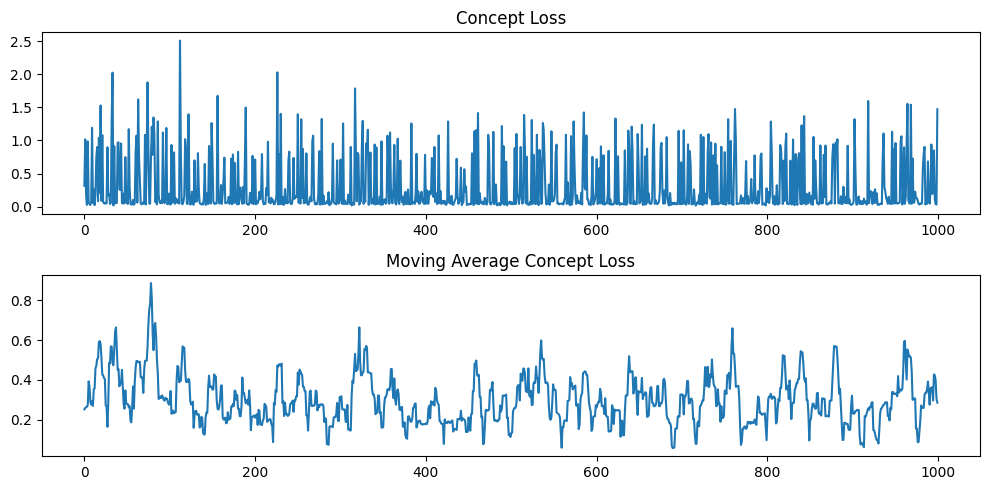

In [9]:
progress_bar = tqdm(
    range(0, max_train_steps),
    desc="Steps",
)

losses = {}

for epoch in range(max_train_steps):
    
    u = compute_density_for_timestep_sampling(
        weighting_scheme=weighting_scheme,
        batch_size=bsz,
        logit_mean=logit_mean,
        logit_std=logit_std,
        mode_scale=mode_scale,
    )
    indices = (u * noise_scheduler_copy.config.num_train_timesteps).long()
    timesteps = noise_scheduler_copy.timesteps[indices].to(device=device)
    
    # get initial latents or x_t to train
    timestep_to_infer = (indices[0] * (num_inference_steps/noise_scheduler_copy.config.num_train_timesteps)).long().item()
    with torch.no_grad():
        packed_noisy_model_input = pipe(
                        target_prompt,
                        height=height,
                        width=width,
                        guidance_scale=guidance_scale,
                        num_inference_steps=num_inference_steps,
                        max_sequence_length=max_sequence_length,
                        num_images_per_prompt=bsz,
                        generator=None,
                        from_timestep=0,
                        till_timestep=timestep_to_infer,
                        output_type='latent'
                    )
        vae_scale_factor = 2 ** (len(vae.config.block_out_channels))
        # calculate this only once since it is only used for shape (TODO: think of a more efficient way)
        if epoch == 0:
            model_input = FluxPipeline._unpack_latents(
                packed_noisy_model_input,
                height=height,
                width=width,
                vae_scale_factor=vae_scale_factor,
            )

    latent_image_ids = FluxPipeline._prepare_latent_image_ids(
                            model_input.shape[0],
                            model_input.shape[2],
                            model_input.shape[3],
                            device,
                            weight_dtype,
                        )

    sigmas = get_sigmas(timesteps, n_dim=model_input.ndim, device=device, dtype=model_input.dtype)
  
    # handle guidance
    if transformer.config.guidance_embeds:
        guidance = torch.tensor([guidance_scale], device=device)
        guidance = guidance.expand(model_input.shape[0])
    else:
        guidance = None

    # Predict the noise residual
    with ExitStack() as stack:
        for net in networks:
            stack.enter_context(networks[net])
        model_pred = transformer(
            hidden_states=packed_noisy_model_input,
            # YiYi notes: divide it by 1000 for now because we scale it by 1000 in the transforme rmodel (we should not keep it but I want to keep the inputs same for the model for testing)
            timestep=timesteps / 1000,
            guidance=guidance,
            pooled_projections=target_pooled_prompt_embeds,
            encoder_hidden_states=target_prompt_embeds,
            txt_ids=target_text_ids,
            img_ids=latent_image_ids,
            return_dict=False,
        )[0]
    model_pred = FluxPipeline._unpack_latents(
        model_pred,
        height=int(model_input.shape[2] * vae_scale_factor / 2),
        width=int(model_input.shape[3] * vae_scale_factor / 2),
        vae_scale_factor=vae_scale_factor,
    )
    
    with torch.no_grad():
        target_pred = transformer(
            hidden_states=packed_noisy_model_input,
            # YiYi notes: divide it by 1000 for now because we scale it by 1000 in the transforme rmodel (we should not keep it but I want to keep the inputs same for the model for testing)
            timestep=timesteps / 1000,
            guidance=guidance,
            pooled_projections=target_pooled_prompt_embeds,
            encoder_hidden_states=target_prompt_embeds,
            txt_ids=target_text_ids,
            img_ids=latent_image_ids,
            return_dict=False,
        )[0]
        target_pred = FluxPipeline._unpack_latents(
            target_pred,
            height=int(model_input.shape[2] * vae_scale_factor / 2),
            width=int(model_input.shape[3] * vae_scale_factor / 2),
            vae_scale_factor=vae_scale_factor,
        )
        
        positive_pred = transformer(
            hidden_states=packed_noisy_model_input,
            # YiYi notes: divide it by 1000 for now because we scale it by 1000 in the transforme rmodel (we should not keep it but I want to keep the inputs same for the model for testing)
            timestep=timesteps / 1000,
            guidance=guidance,
            pooled_projections=positive_pooled_prompt_embeds,
            encoder_hidden_states=positive_prompt_embeds,
            txt_ids=positive_text_ids,
            img_ids=latent_image_ids,
            return_dict=False,
        )[0]
        positive_pred = FluxPipeline._unpack_latents(
            positive_pred,
            height=int(model_input.shape[2] * vae_scale_factor / 2),
            width=int(model_input.shape[3] * vae_scale_factor / 2),
            vae_scale_factor=vae_scale_factor,
        )

        negative_pred = transformer(
            hidden_states=packed_noisy_model_input,
            # YiYi notes: divide it by 1000 for now because we scale it by 1000 in the transforme rmodel (we should not keep it but I want to keep the inputs same for the model for testing)
            timestep=timesteps / 1000,
            guidance=guidance,
            pooled_projections=negative_pooled_prompt_embeds,
            encoder_hidden_states=negative_prompt_embeds,
            txt_ids=negative_text_ids,
            img_ids=latent_image_ids,
            return_dict=False,
        )[0]
        negative_pred = FluxPipeline._unpack_latents(
            negative_pred,
            height=int(model_input.shape[2] * vae_scale_factor / 2),
            width=int(model_input.shape[3] * vae_scale_factor / 2),
            vae_scale_factor=vae_scale_factor,
        )

        gt_pred = target_pred + eta*(positive_pred - negative_pred)

        gt_pred = (gt_pred/gt_pred.norm()) * positive_pred.norm()
    # Compute regular loss.
    concept_loss = torch.mean(
        ((model_pred.float() - gt_pred.float()) ** 2).reshape(gt_pred.shape[0], -1),
        1,
    )
    concept_loss = concept_loss.mean()

    concept_loss.backward()
    losses['concept'] = losses.get('concept', []) + [concept_loss.item()]
    
    logs = {"concept loss": losses['concept'][-1], "lr": lr_scheduler.get_last_lr()[0]}
    
    optimizer.step()
    lr_scheduler.step()
    optimizer.zero_grad()
    
    progress_bar.update(1)
    progress_bar.set_postfix(**logs)
    
print('Training Done')
plot_history(losses)

## Save LoRAs

In [10]:
# Save the trained LoRA model
save_name = f"flux-{slider_name}"
save_path = f'{output_dir}/{save_name}/'
os.makedirs(save_path, exist_ok=True)

In [11]:
print("Saving...")
for i in range(num_sliders):
    networks[i].save_weights(
         f"{save_path}/slider_{i}.pt",
        dtype=weight_dtype,
    )
flush()
print("Done.")

Saving...
Done.


## Load LoRAs

In [12]:
# for i in range(num_sliders):
#     networks[i].load_state_dict(torch.load(
#          f"{save_path}/slider_{i}.pt"
#     ))

# for net in networks:
#     with networks[net]:
#         pass

# Inference

In [15]:
seeds

[3671, 8576, 8770, 5687, 17951]

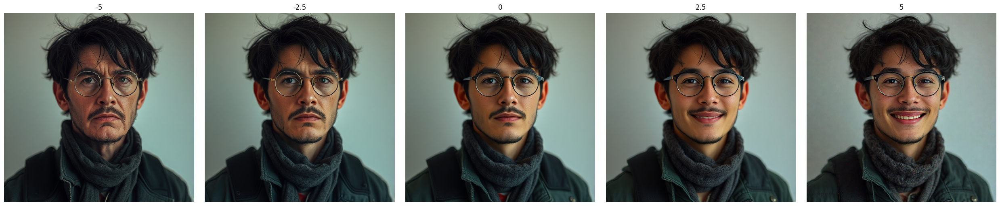

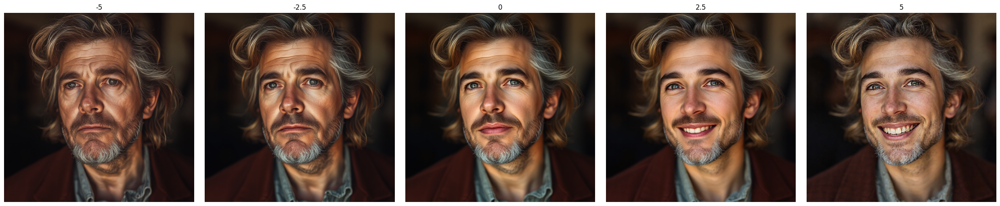

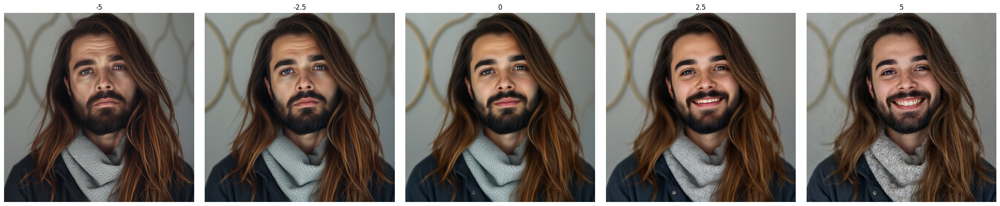

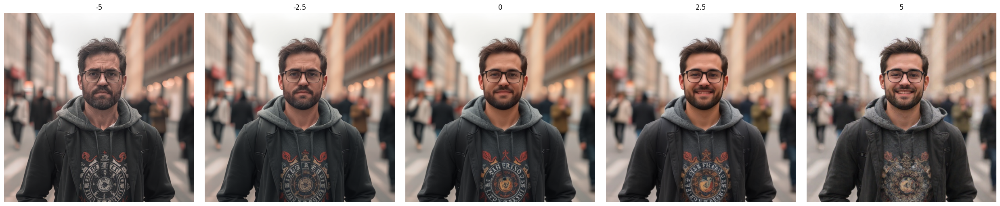

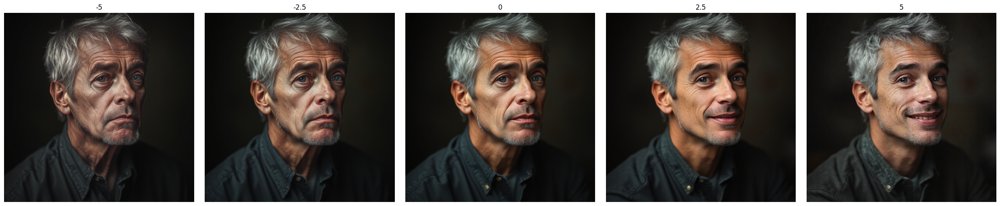

In [14]:
# prompts to try
prompts = [ 
            target_prompt ,
           ]
# LoRA weights/scale to test
slider_scales = [-5, -2.5, 0, 2.5, 5]
pipe.set_progress_bar_config(disable=True)
num_images = 5
seeds = [random.randint(0, 2**15) for _ in range(num_images)]
for net in networks:
    print(f'Slider {net}')
    for idx in range(num_images):
        slider_images = []
        seed = seeds[idx]
        for slider_scale in slider_scales:
            networks[net].set_lora_slider(scale=slider_scale)
            with torch.no_grad():
                image = pipe(
                    target_prompt,
                    height=height,
                    width=width,
                    guidance_scale=guidance_scale,
                    num_inference_steps=num_inference_steps,
                    max_sequence_length=max_sequence_length,
                    num_images_per_prompt=1,
                    generator=torch.Generator().manual_seed(seed),
                    from_timestep=0,
                    till_timestep=None,
                    output_type='pil',
                    network=networks[net], 
                    skip_slider_timestep_till=0, # this will skip adding the slider on the first step of generation ('1' will skip first 2 steps)
                )
            slider_images.append(image.images[0])
        plot_labeled_images(slider_images, slider_scales)